<a href="https://colab.research.google.com/github/Saiyamsanghvi/CSE-541-Computer-Vision-2023-Group20/blob/main/Fire_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



1.   List item

1.   List item
2.   List item


2.   List item



# FIre and Smoke Detection with Keras and Deep Leaning
## 2017-FYP-7




In [1]:
#!pip uninstall tensorflow

In [2]:
#! wget https://repo.anaconda.com/miniconda/Miniconda3-py37_4.8.2-Linux-x86_64.sh
#! chmod +x Miniconda3-py37_4.8.2-Linux-x86_64.sh
#! bash ./Miniconda3-py37_4.8.2-Linux-x86_64.sh -b -f -p /usr/local
#import sys
#sys.path.append('/usr/local/lib/python3.7/site-packages/')#

In [3]:
#!sudo apt install python3-pip

In [4]:
#!pip install tensorflow

##Import Libraries and Neural Network Model Class

In [5]:
#!python --version

In [6]:
#!conda install -c conda-forge tensorflow==2.2.0 --y

In [7]:
#!pip install protobuf==3.20.*

In [8]:
#!python

In [9]:
#!pip uninstall tensorflow==2.12.0

In [10]:
import tensorflow as tf
print(tf.__version__)
print(tf.test.gpu_device_name())

2.12.0
/device:GPU:0


In [38]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import SeparableConv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense

class FireDetectionNet:
	@staticmethod
	def build(width, height, depth, classes):
		model = Sequential()
		inputShape = (height, width, depth)
		chanDim = -1

	
		model.add(SeparableConv2D(16, (7, 7), padding="same",
			input_shape=inputShape))
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
		model.add(MaxPooling2D(pool_size=(2, 2)))

		model.add(SeparableConv2D(32, (3, 3), padding="same"))
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
		model.add(MaxPooling2D(pool_size=(2, 2)))

		model.add(SeparableConv2D(64, (3, 3), padding="same"))
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
		model.add(SeparableConv2D(64, (3, 3), padding="same"))
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
		model.add(MaxPooling2D(pool_size=(2, 2)))

		model.add(Flatten())
		model.add(Dense(128))
		model.add(Activation("relu"))
		model.add(BatchNormalization())
		model.add(Dropout(0.5))
	
		#model.add(Dense(128))
		#model.add(Activation("relu"))
		#model.add(BatchNormalization())
		#model.add(Dropout(0.5))

		model.add(Dense(classes))
		model.add(Activation("softmax"))

		return model

# Mount Google Drive with Google Colab


In [39]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##Import Data from Google Drive

In [40]:
FIRE_PATH = '/content/drive/My Drive/Fire and Smoke DATASET/Fire Dataset'
NON_FIRE_PATH = '/content/drive/My Drive/Fire and Smoke DATASET/Non-Fire Dataset'

CLASSES = ["Non-Fire", "Fire"]

TRAIN_SPLIT = 0.70
TEST_SPLIT = 0.30

INIT_LR = 1e-1
BATCH_SIZE = 32
NUM_EPOCHS = 120

SAMPLE_SIZE = 50

In [41]:
import matplotlib
matplotlib.use("Agg")

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import argparse
import cv2
import sys

def load_dataset(datasetPath):
	imagePaths = list(paths.list_images(datasetPath))
	data = []

	for imagePath in imagePaths:
		image = cv2.imread(imagePath)
		image = cv2.resize(image, (128, 128))
		data.append(image)

	return np.array(data, dtype="float32")

print("[INFO] loading data...")
fireData = load_dataset( FIRE_PATH)
nonFireData = load_dataset( NON_FIRE_PATH)
print("[INFO] Completed")

[INFO] loading data...
[INFO] Completed


##Preprocessing and Exploring Dataset

In [42]:
print(fireData.shape)
print(nonFireData.shape)

(1315, 128, 128, 3)
(2688, 128, 128, 3)


In [43]:
fireLabels = np.ones((fireData.shape[0],))
nonFireLabels = np.zeros((nonFireData.shape[0],))

data = np.vstack([fireData, nonFireData])
labels = np.hstack([fireLabels, nonFireLabels])


In [44]:
data /= 255
labels = to_categorical(labels, num_classes=2)
classTotals = labels.sum(axis=0)
classWeight = classTotals.max() / classTotals

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [1., 0.],
       [1., 0.],
       [1., 0.]], dtype=float32)

array([2688., 1315.], dtype=float32)

array([1.       , 2.0441065], dtype=float32)

In [46]:
print(data.shape)
print(labels.shape)
print(labels[1:])
print(classTotals)

(4003, 128, 128, 3)
(4003, 2)
[[0. 1.]
 [0. 1.]
 [0. 1.]
 ...
 [1. 0.]
 [1. 0.]
 [1. 0.]]
[2688. 1315.]


In [47]:
# construct the training and testing split
(trainX, testX, trainY, testY) = train_test_split(data, labels,
	test_size= TEST_SPLIT, random_state=42)

In [48]:
print(trainX.shape)
print(trainY.shape)
print(testX.shape)
print(testY.shape)

(2802, 128, 128, 3)
(2802, 2)
(1201, 128, 128, 3)
(1201, 2)


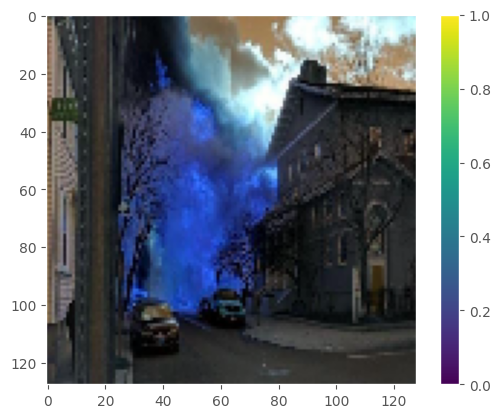

In [49]:
%matplotlib inline
plt.figure()
plt.imshow(trainX[1])
plt.colorbar()
plt.grid(False)
plt.show()

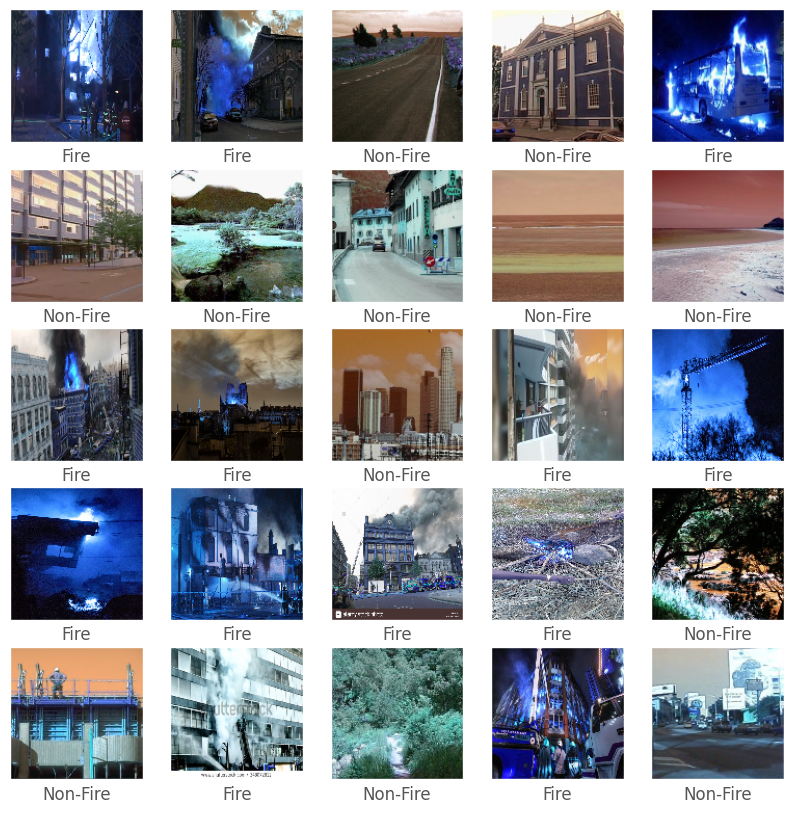

In [50]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(trainX[i], cmap=plt.cm.binary)
    if trainY[i][0] == 1:
      plt.xlabel("Non-Fire")
    else:
      plt.xlabel("Fire")

plt.show()

##Training Model

In [2]:
from tensorflow import keras
from tensorflow.keras.callbacks import TensorBoard
from keras.preprocessing.image import ImageDataGenerator

In [3]:
%load_ext tensorboard
!rm -rf ./logs/ #to delete previous runs
%tensorboard --logdir logs/
tensorboard = TensorBoard(log_dir="./logs", histogram_freq=1)
# initialize the training data augmentation object
aug = ImageDataGenerator(
	rotation_range=30,
	zoom_range=0.15,
	width_shift_range=0.2,
	height_shift_range=0.2,
	shear_range=0.15,
	horizontal_flip=True,
	fill_mode="nearest")

# initialize the optimizer and model
print("[INFO] compiling model...")
#opt = SGD(lr= INIT_LR, momentum=0.9,
#	decay= INIT_LR /  NUM_EPOCHS)
opt = keras.optimizers.Adam(lr=INIT_LR)
model = FireDetectionNet.build(width=128, height=128, depth=3,
	classes=2)
model.compile(loss="binary_crossentropy", optimizer=opt,
	metrics=["accuracy"])

# check to see if we are attempting to find an optimal learning rate
# before training for the full number of epochs

# train the network
print("[INFO] training network...")
H = model.fit_generator(
	aug.flow(trainX, trainY, batch_size= BATCH_SIZE),
	validation_data=(testX, testY),
	steps_per_epoch=trainX.shape[0] //  BATCH_SIZE,
	epochs= NUM_EPOCHS,
	callbacks=[tensorboard]
	)
#class_weight=classWeight,verbose=1,callbacks=[tensorboard]
# evaluate the network and show a classification report
print("[INFO] evaluating network...")
predictions = model.predict(testX, batch_size= BATCH_SIZE)
print(classification_report(testY.argmax(axis=1),
	predictions.argmax(axis=1), target_names= CLASSES))

# serialize the model to disk
#print("[INFO] serializing network to '{}'...".format( MODEL_PATH))
#model.save( MODEL_PATH)



The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 709), started 0:00:49 ago. (Use '!kill 709' to kill it.)

<IPython.core.display.Javascript object>

[INFO] compiling model...


NameError: ignored

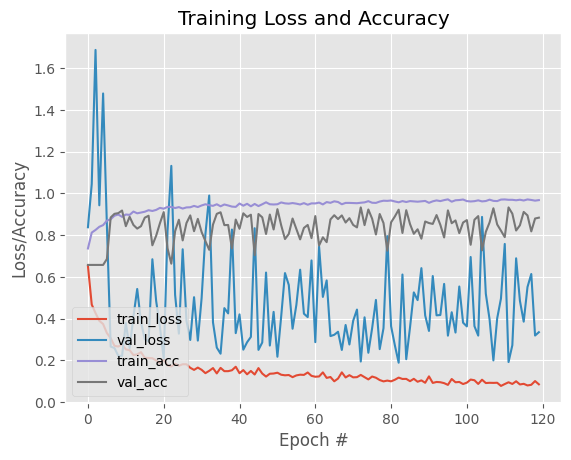

In [28]:
%matplotlib inline
#import matplotlib.pyplot as plt
#print(H.history["loss"])
#N = np.arange(0,  NUM_EPOCHS)
#print(N)
#plt.plot(N,H.history["loss"])
import matplotlib.pyplot as plt
import numpy as np

N = np.arange(0,  NUM_EPOCHS)
plt.style.use("ggplot")
fig = plt.figure()
plt.plot(N, H.history["loss"], label="train_loss")
plt.plot(N, H.history["val_loss"], label="val_loss")
plt.plot(N, H.history["accuracy"], label="train_acc")
plt.plot(N, H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")

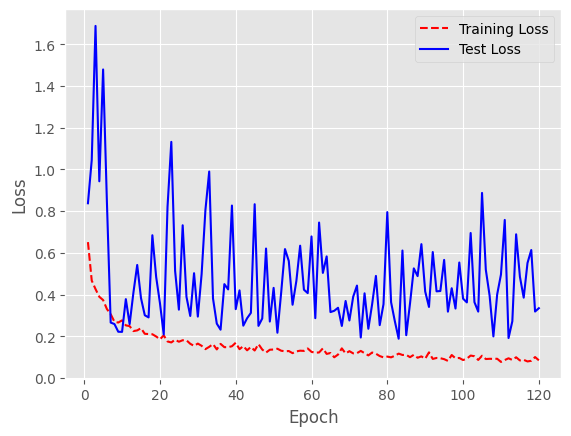

In [29]:
fig.savefig('my_figure.png')

##Exploring Predictions

In [30]:
print(predictions.shape)
print(predictions[:1])

(1201, 2)
[[2.9848468e-10 1.0000000e+00]]


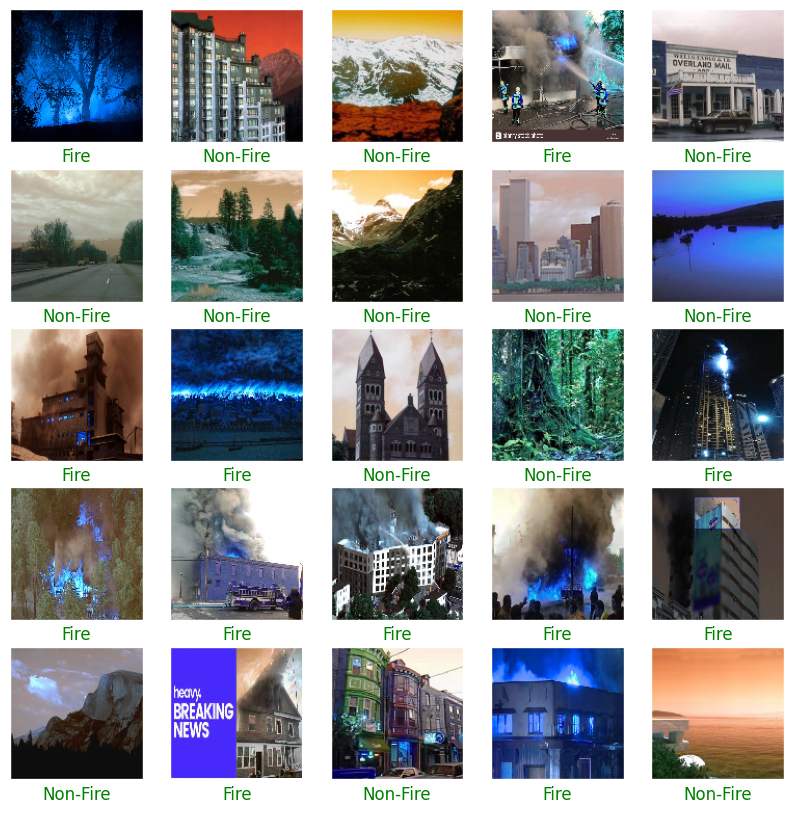

In [31]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(testX[i], cmap=plt.cm.binary)
    if testY[i][0] == 1:
      if predictions[i][0] > 0.5:
        plt.xlabel("Non-Fire", color='green')
      else:
        plt.xlabel("Non-Fire", color='red')
    else:
      if predictions[i][1] > 0.5:
        plt.xlabel("Fire", color='green')
      else:
        plt.xlabel("Fire", color='red')

plt.show()

In [32]:
MODEL_PATH = '/content/drive/My Drive/firedata'
model.save( MODEL_PATH)

In [33]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 separable_conv2d (Separable  (None, 128, 128, 16)     211       
 Conv2D)                                                         
                                                                 
 activation (Activation)     (None, 128, 128, 16)      0         
                                                                 
 batch_normalization (BatchN  (None, 128, 128, 16)     64        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 16)       0         
 )                                                               
                                                                 
 separable_conv2d_1 (Separab  (None, 64, 64, 32)       688       
 leConv2D)                                              

#Save model and architecture to single file


In [34]:
# save model and architecture to single file
model.save("/content/drive/My Drive/Colab Notebooks/2017ee80.h5")
print("Saved model to drive")

Saved model to drive


# Thank you